# Lab 9 & 10 — Image Stitching and Panorama Creation

| | |
|---|---|
| **Name** | Rutvik Prajapati |
| **Course** | Computer Vision |
| **Instructor** | Mr. Chintan Patel |
| **Platform** | Google Colab |

---

## Objective

Stitch multiple overlapping photos into one wide panoramic image using classical Computer Vision.
We build the full pipeline step-by-step (feature detection → matching → homography → warping → blending)
and also compare with OpenCV's built-in `cv2.Stitcher` class.

---

## What is Image Stitching?

When you rotate your camera slightly between shots the photos overlap.
Stitching finds those overlapping regions and joins all photos into one wide panorama —
exactly what your phone does in panorama mode, but here we do it step by step.

**Pipeline:**
1. **Feature Detection** — find corners/blobs in each image (ORB / SIFT)
2. **Feature Matching** — match those points across two images (BFMatcher + Lowe ratio test)
3. **Homography** — compute the geometric transform using RANSAC
4. **Warping** — project one image into the other's coordinate frame
5. **Blending** — merge seamlessly at the join boundary

---

## Dataset

We use the **`gaurvivishnoi/panorama`** dataset from Kaggle,
downloaded directly in Colab using `kagglehub` — no manual upload needed.


---
## Part 0 — Install Libraries


In [ ]:
!pip install -q kagglehub opencv-contrib-python --upgrade
print('Done!')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 12.2 MB/s eta 0:00:00
Done!


---
## Part 1 — Configure Kaggle & Download Dataset

We use `kagglehub` with credentials written directly in code — no file upload needed.


In [ ]:
import os, json

# write Kaggle credentials so kagglehub can authenticate
os.makedirs(os.path.expanduser('~/.config/kaggle'), exist_ok=True)
os.makedirs(os.path.expanduser('~/.kaggle'),        exist_ok=True)

creds = {'username': 'muje nahi pata', 'key': 'khud ka use karlo bhai'}

for cfg_path in ['~/.config/kaggle/kaggle.json', '~/.kaggle/kaggle.json']:
    p = os.path.expanduser(cfg_path)
    with open(p, 'w') as f:
        json.dump(creds, f)
    os.chmod(p, 0o600)

# also set environment variable — kagglehub checks this too
os.environ['KAGGLE_USERNAME'] = creds['username']
os.environ['KAGGLE_KEY']      = creds['key']

print('Kaggle credentials configured!')


Kaggle credentials configured!


In [ ]:
import kagglehub

# download the panorama dataset
# dataset page: https://www.kaggle.com/datasets/gaurvivishnoi/panorama
path = kagglehub.dataset_download('gaurvivishnoi/panorama')
print('Dataset downloaded to:', path)


100%|██████████| 4.56M/4.56M [00:00<00:00, 81.5MB/s]

Extracting files...
Dataset downloaded to: /root/.cache/kagglehub/datasets/gaurvivishnoi/panorama/versions/1


In [ ]:
import os

# see what folders and files we got
for root, dirs, files in os.walk(path):
    level = root.replace(path, '').count(os.sep)
    indent = '  ' * level
    print(f'{indent}{os.path.basename(root)}/')
    if level < 3:
        sub = '  ' * (level + 1)
        for fn in files[:6]:
            print(f'{sub}{fn}')
        if len(files) > 6:
            print(f'{sub}... and {len(files)-6} more')


1/
  001.jpg
  002.jpg
  003.jpg


---
## Part 2 — Load & Visualise Input Images

We find the folder with the most images (= best panorama sequence) and load those.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
from collections import defaultdict

# find every image file in the downloaded dataset
exts = ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG', '*.JPEG']
all_imgs = []
for ext in exts:
    all_imgs.extend(glob.glob(os.path.join(path, '**', ext), recursive=True))
all_imgs = sorted(set(all_imgs))
print(f'Total images found: {len(all_imgs)}')

# group by parent folder
folder_map = defaultdict(list)
for p in all_imgs:
    folder_map[os.path.dirname(p)].append(p)

print(f'\nFolders found: {len(folder_map)}')
for fld, imgs in sorted(folder_map.items(), key=lambda x: -len(x[1])):
    print(f'  {os.path.basename(fld)}: {len(imgs)} images')


Total images found: 3

Folders found: 1
  1: 3 images


In [ ]:
# pick the folder with the most images — that is our panorama sequence
if not folder_map:
    raise RuntimeError('No images found in dataset! Check the path above.')

best_folder = max(folder_map, key=lambda k: len(folder_map[k]))
image_paths = sorted(folder_map[best_folder])  # all images in that folder

print(f'Using folder: {best_folder}')
print(f'Images to stitch: {len(image_paths)}')

# load and optionally resize (keeps Colab RAM happy)
images = []
for p in image_paths:
    img = cv2.imread(p)
    if img is None:
        print(f'  WARNING: could not read {os.path.basename(p)}')
        continue
    h, w = img.shape[:2]
    if w > 900:
        scale = 900 / w
        img = cv2.resize(img, (900, int(h * scale)))
    images.append(img)
    print(f'  {os.path.basename(p)}  ->  {img.shape[1]}x{img.shape[0]}')

print(f'\nLoaded {len(images)} images')

if len(images) < 2:
    raise ValueError('Need at least 2 images to stitch!')


Using folder: /root/.cache/kagglehub/datasets/gaurvivishnoi/panorama/versions/1
Images to stitch: 3
  001.jpg  ->  900x675
  002.jpg  ->  900x675
  003.jpg  ->  900x675

Loaded 3 images


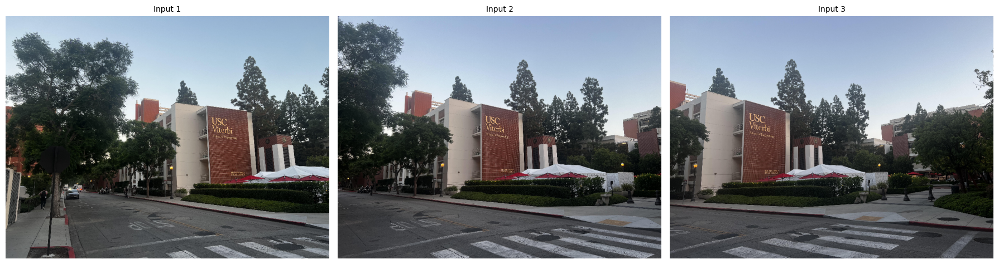

These overlapping photos will be stitched into one panorama.


In [ ]:
# display all input images
def show_images(images, titles=None, figsize=(18, 5)):
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    for i, (ax, img) in enumerate(zip(axes, images)):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(titles[i] if titles else f'Image {i+1}', fontsize=10)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

show_images(images, titles=[f'Input {i+1}' for i in range(len(images))])
print('These overlapping photos will be stitched into one panorama.')


---
## Part 3 — Manual Stitching Pipeline (Step by Step)

We build the full pipeline ourselves so every step is visible and understandable.

### Step 3A — Feature Detection & Matching (ORB)

**ORB** = Oriented FAST + Rotated BRIEF.  
Fast, patent-free, uses Hamming distance for matching.


In [ ]:
def detect_and_match(img1, img2, n_features=3000, ratio=0.75):
    """
    Detect ORB keypoints in both images and return good matches
    after Lowe's ratio test to filter out ambiguous ones.
    """
    g1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    g2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    orb = cv2.ORB_create(nfeatures=n_features)
    kp1, des1 = orb.detectAndCompute(g1, None)
    kp2, des2 = orb.detectAndCompute(g2, None)

    if des1 is None or des2 is None or len(des1) < 2 or len(des2) < 2:
        print('  Not enough descriptors found!')
        return kp1, kp2, []

    bf  = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    raw = bf.knnMatch(des1, des2, k=2)

    good = []
    for pair in raw:
        if len(pair) == 2:
            m, n = pair
            if m.distance < ratio * n.distance:
                good.append(m)

    print(f'  KP1={len(kp1)}, KP2={len(kp2)}, good matches={len(good)}')
    return kp1, kp2, good


Feature matching on Images 1 & 2:
  KP1=3000, KP2=3000, good matches=845


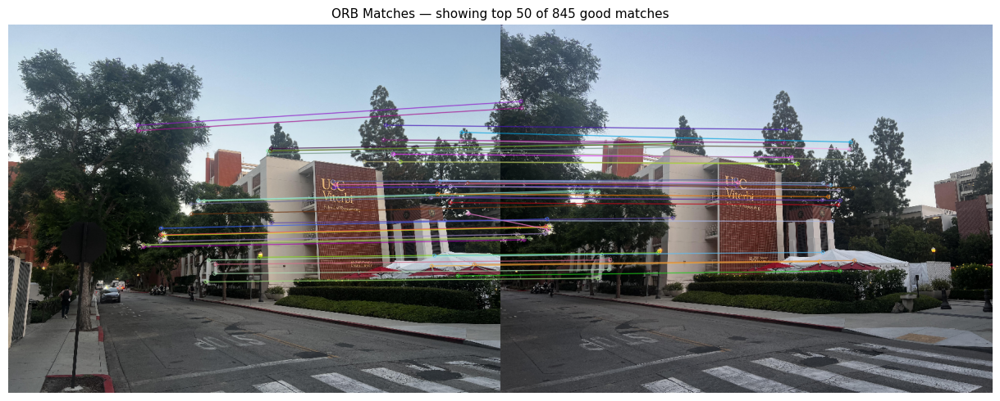

Each line connects the same physical point seen in both photos.


In [ ]:
# test on first two images
print('Feature matching on Images 1 & 2:')
kp1, kp2, good = detect_and_match(images[0], images[1])

vis = cv2.drawMatches(
    images[0], kp1, images[1], kp2,
    good[:50], None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)
plt.figure(figsize=(16, 5))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title(f'ORB Matches — showing top 50 of {len(good)} good matches', fontsize=11)
plt.axis('off')
plt.tight_layout()
plt.show()
print('Each line connects the same physical point seen in both photos.')


### Step 3B — Homography Estimation with RANSAC


In [ ]:
def compute_homography(kp1, kp2, good, min_matches=10):
    """
    Estimate homography matrix H from matched keypoints using RANSAC.
    RANSAC automatically discards wrong matches (outliers).
    Returns (H, mask) or (None, None) on failure.
    """
    if len(good) < min_matches:
        print(f'  Too few matches ({len(good)}), need >= {min_matches}')
        return None, None

    src = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src, dst, cv2.RANSAC, ransacReprojThreshold=5.0)
    if H is None:
        print('  Homography returned None')
        return None, None

    inliers = int(mask.sum())
    print(f'  Homography OK: {inliers}/{len(good)} inliers ({100*inliers//len(good)}%)')
    return H, mask


In [ ]:
print('Computing homography for Images 1 & 2:')
H12, mask12 = compute_homography(kp1, kp2, good)

if H12 is not None:
    print('\nHomography matrix H:')
    print(np.round(H12, 4))
    print('\nThis 3x3 matrix maps pixel coordinates in Image 1 into Image 2 space.')


Computing homography for Images 1 & 2:
  Homography OK: 823/845 inliers (97%)

Homography matrix H:
[[ 1.495100e+00 -4.280000e-02 -3.060550e+02]
 [ 2.324000e-01  1.301300e+00 -1.368431e+02]
 [ 5.000000e-04  0.000000e+00  1.000000e+00]]

This 3x3 matrix maps pixel coordinates in Image 1 into Image 2 space.


### Step 3C — Warp & Stitch Two Images


In [ ]:
def warp_and_stitch(img1, img2, H):
    """
    Warps img2 into img1's coordinate frame using H,
    then overlays img1. Hard-cut blending (seam visible).
    """
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    # project img2's corners to find full bounding box
    c2  = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
    c2w = cv2.perspectiveTransform(c2, H)
    c1  = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    all_c = np.concatenate([c1, c2w], axis=0)

    [xmin, ymin] = np.int32(all_c.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_c.max(axis=0).ravel() + 0.5)

    T = np.array([[1,0,-xmin],[0,1,-ymin],[0,0,1]], dtype=np.float64)
    result = cv2.warpPerspective(img2, T @ H, (xmax-xmin, ymax-ymin))

    ys, xs = -ymin, -xmin
    result[ys:ys+h1, xs:xs+w1] = img1
    return result


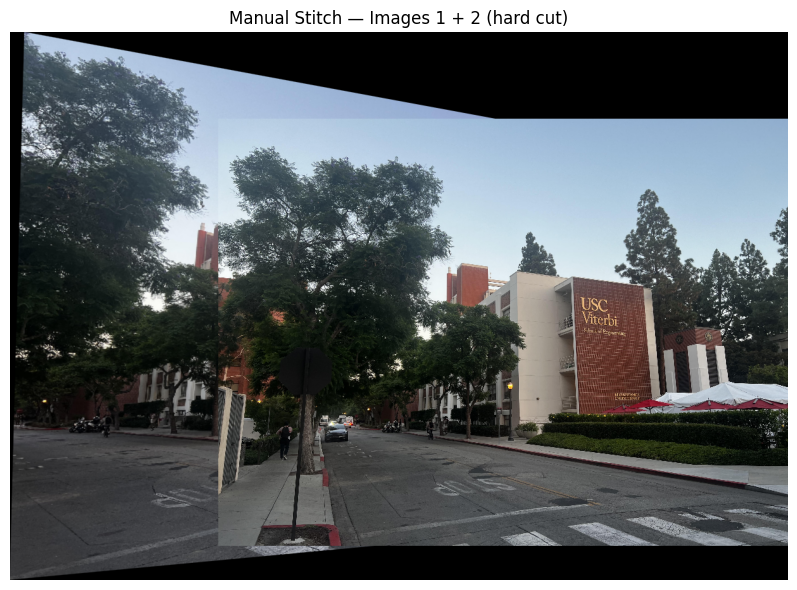

Output: 1229 x 866 px
The visible seam at the join will be fixed with alpha blending in Part 5.


In [ ]:
if H12 is not None:
    stitched_2 = warp_and_stitch(images[0], images[1], H12)
    plt.figure(figsize=(14, 6))
    plt.imshow(cv2.cvtColor(stitched_2, cv2.COLOR_BGR2RGB))
    plt.title('Manual Stitch — Images 1 + 2 (hard cut)', fontsize=12)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    print(f'Output: {stitched_2.shape[1]} x {stitched_2.shape[0]} px')
    print('The visible seam at the join will be fixed with alpha blending in Part 5.')


### Step 3D — Stitch All Images Sequentially → Full Panorama


In [ ]:
def stitch_all_manual(images):
    """
    Merges a list of images into one panorama left-to-right.
    Strategy: pano = img0, then add img1, img2, ... one by one.
    """
    pano = images[0].copy()
    for i in range(1, len(images)):
        print(f'\n--- Adding image {i+1} of {len(images)} ---')
        kp_a, kp_b, gm = detect_and_match(pano, images[i])
        if len(gm) < 10:
            print(f'  Skipped: only {len(gm)} good matches')
            continue
        Hm, _ = compute_homography(kp_a, kp_b, gm)
        if Hm is None:
            print('  Skipped: homography failed')
            continue
        pano = warp_and_stitch(pano, images[i], Hm)
        print(f'  Panorama so far: {pano.shape[1]} x {pano.shape[0]} px')
    return pano


Running manual stitching on all images...

--- Adding image 2 of 3 ---
  KP1=3000, KP2=3000, good matches=845
  Homography OK: 823/845 inliers (97%)
  Panorama so far: 1229 x 866 px

--- Adding image 3 of 3 ---
  KP1=3000, KP2=3000, good matches=425
  Homography OK: 383/425 inliers (90%)
  Panorama so far: 4178 x 2454 px


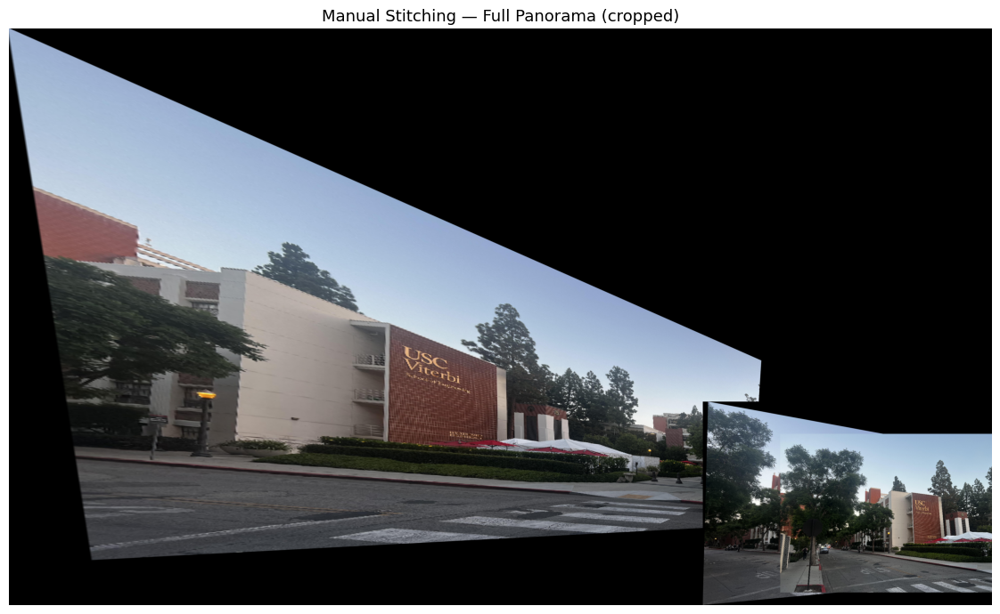

Final panorama: 4178 x 2454 px


In [ ]:
print('Running manual stitching on all images...')
print('=' * 55)
manual_panorama = stitch_all_manual(images)

# crop black borders (same logic as your friend's code)
gray_m = cv2.cvtColor(manual_panorama, cv2.COLOR_BGR2GRAY)
_, thresh_m = cv2.threshold(gray_m, 1, 255, cv2.THRESH_BINARY)
coords_m = cv2.findNonZero(thresh_m)
if coords_m is not None:
    xc, yc, wc, hc = cv2.boundingRect(coords_m)
    manual_panorama = manual_panorama[yc:yc+hc, xc:xc+wc]

plt.figure(figsize=(16, 7))
plt.imshow(cv2.cvtColor(manual_panorama, cv2.COLOR_BGR2RGB))
plt.title('Manual Stitching — Full Panorama (cropped)', fontsize=13)
plt.axis('off')
plt.tight_layout()
plt.show()
print(f'Final panorama: {manual_panorama.shape[1]} x {manual_panorama.shape[0]} px')


---
## Part 4 — OpenCV Built-in Stitcher (Same as Your Friend's Code)

`cv2.Stitcher` automates everything — feature detection, matching, homography,
exposure compensation, and multi-band blending all in one call.

We test both modes:
- **PANORAMA** — rotating camera shots (typical phone panoramas)
- **SCANS** — flat document or aerial scans


Running OpenCV Stitcher — PANORAMA mode...
  Success in 1.22s  |  output: 1182x628


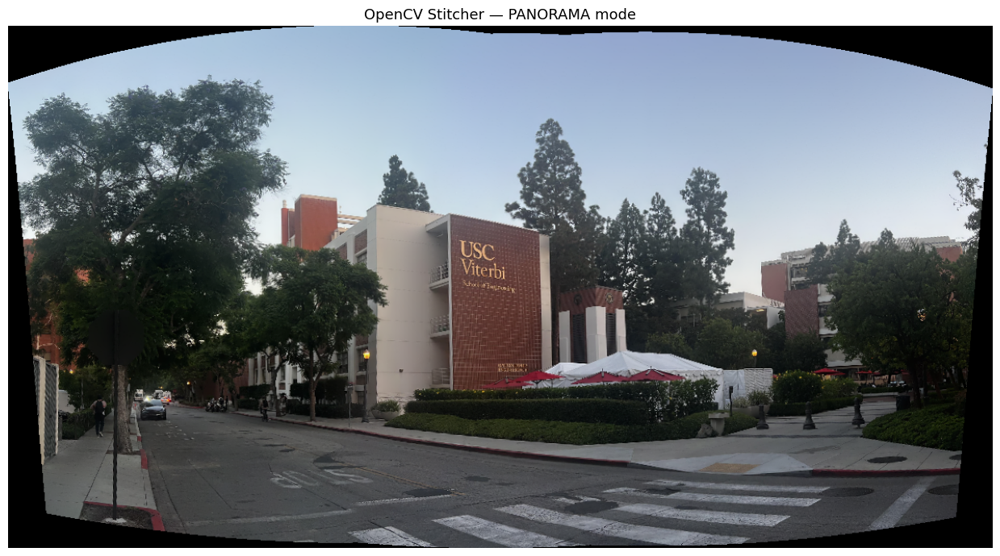

Running OpenCV Stitcher — SCANS mode...
  Success in 1.07s  |  output: 1139x720


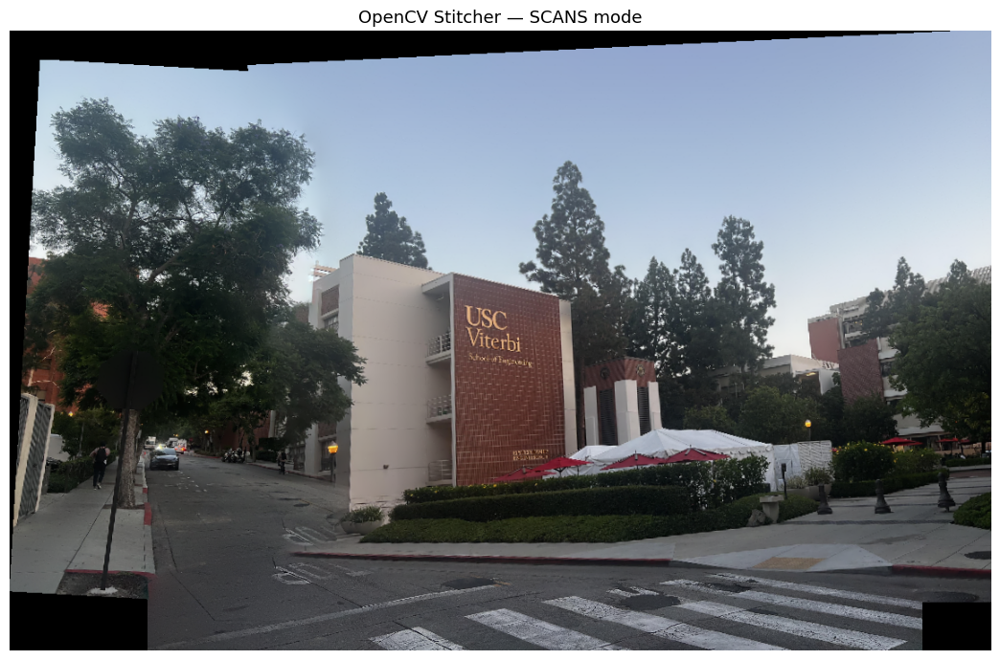

In [ ]:
import time

STATUS = {
    0: 'OK',
    1: 'ERR_NEED_MORE_IMGS',
    2: 'ERR_HOMOGRAPHY_EST_FAIL',
    3: 'ERR_CAMERA_PARAMS_ADJUST_FAIL'
}

def crop_black(img):
    """Remove black borders from stitched result — same as your friend's code."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    coords = cv2.findNonZero(thresh)
    if coords is None:
        return img
    x, y, w, h = cv2.boundingRect(coords)
    return img[y:y+h, x:x+w]


def run_stitcher(images, mode, label):
    print(f'Running OpenCV Stitcher — {label}...')
    t0 = time.time()

    stitcher = cv2.Stitcher_create(mode)
    # lower confidence threshold slightly — helps when overlap is moderate
    stitcher.setPanoConfidenceThresh(0.5)
    status, panorama = stitcher.stitch(images)

    elapsed = time.time() - t0

    if status == cv2.Stitcher_OK:
        panorama = crop_black(panorama)
        print(f'  Success in {elapsed:.2f}s  |  output: {panorama.shape[1]}x{panorama.shape[0]}')
        plt.figure(figsize=(16, 7))
        plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
        plt.title(f'OpenCV Stitcher — {label}', fontsize=13)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        return panorama
    else:
        msg = STATUS.get(status, str(status))
        print(f'  Failed: {msg}')
        if status == 1:
            print('  Tip: need more overlap between images, or use more images.')
        elif status == 2:
            print('  Tip: check for motion blur or very different exposures.')
        return None


pano_panorama = run_stitcher(images, cv2.Stitcher_PANORAMA, 'PANORAMA mode')
pano_scans    = run_stitcher(images, cv2.Stitcher_SCANS,    'SCANS mode')


---
## Part 5 — Comparison: Manual vs OpenCV Stitcher


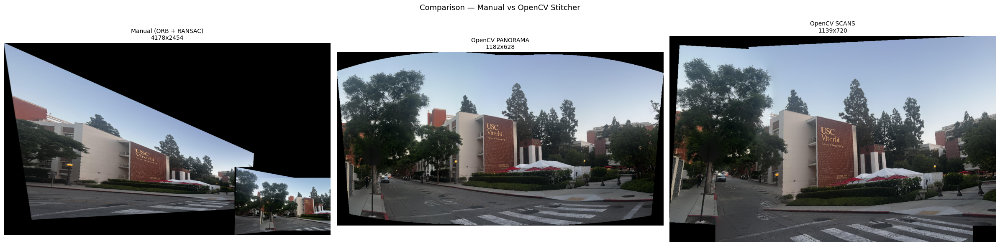

In [ ]:
result_imgs   = [manual_panorama]
result_labels = ['Manual (ORB + RANSAC)']

if pano_panorama is not None:
    result_imgs.append(pano_panorama)
    result_labels.append('OpenCV PANORAMA')

if pano_scans is not None:
    result_imgs.append(pano_scans)
    result_labels.append('OpenCV SCANS')

n = len(result_imgs)
fig, axes = plt.subplots(1, n, figsize=(8*n, 6))
if n == 1:
    axes = [axes]

for ax, img, lbl in zip(axes, result_imgs, result_labels):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f'{lbl}\n{img.shape[1]}x{img.shape[0]}', fontsize=10)
    ax.axis('off')

plt.suptitle('Comparison — Manual vs OpenCV Stitcher', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()


---
## Part 6 — Alpha Blending to Fix the Seam

The manual stitch has a hard visible seam where the two images meet.
Alpha blending assigns weights proportionally in the overlap zone — the transition becomes smooth.


In [ ]:
def alpha_blend_stitch(img1, img2, H):
    """
    Like warp_and_stitch but linearly blends pixels in the overlap zone.
    img1 fades out while img2 fades in across the overlapping region.
    """
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    c2  = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
    c2w = cv2.perspectiveTransform(c2, H)
    c1  = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    all_c = np.concatenate([c1, c2w], axis=0)

    [xmin, ymin] = np.int32(all_c.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_c.max(axis=0).ravel() + 0.5)
    T  = np.array([[1,0,-xmin],[0,1,-ymin],[0,0,1]], dtype=np.float64)
    W  = xmax - xmin
    Hc = ymax - ymin

    canvas2 = cv2.warpPerspective(img2, T @ H, (W, Hc))
    canvas1 = np.zeros((Hc, W, 3), dtype=np.uint8)
    ys, xs  = -ymin, -xmin
    canvas1[ys:ys+h1, xs:xs+w1] = img1

    m1    = (canvas1.sum(axis=2) > 0).astype(np.float32)
    m2    = (canvas2.sum(axis=2) > 0).astype(np.float32)
    total = m1 + m2
    alpha = np.where(total > 0, m1 / total, 0.0)[:, :, np.newaxis]

    blended = (
        canvas1.astype(np.float32) * alpha +
        canvas2.astype(np.float32) * (1.0 - alpha)
    ).astype(np.uint8)
    return blended


/tmp/ipykernel_379/1636727699.py:28: RuntimeWarning: invalid value encountered in divide
  alpha = np.where(total > 0, m1 / total, 0.0)[:, :, np.newaxis]


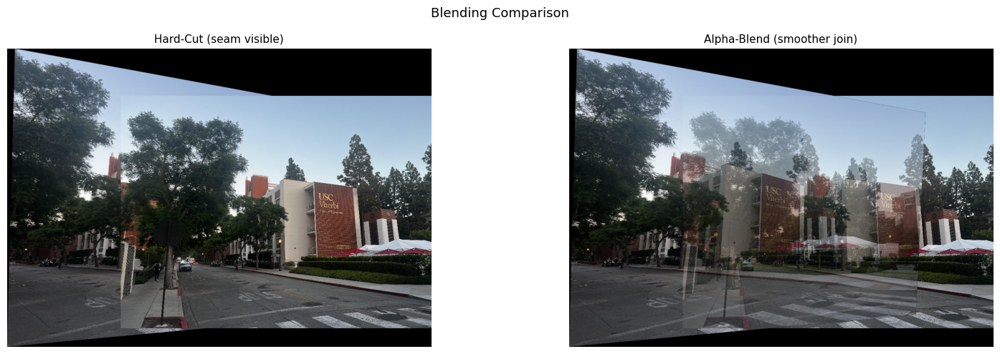

Alpha blending smoothly distributes the overlap — seam much less visible.


In [ ]:
if H12 is not None:
    hard_cut     = warp_and_stitch(images[0], images[1], H12)
    alpha_result = alpha_blend_stitch(images[0], images[1], H12)

    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    axes[0].imshow(cv2.cvtColor(hard_cut,     cv2.COLOR_BGR2RGB))
    axes[0].set_title('Hard-Cut (seam visible)',   fontsize=11)
    axes[0].axis('off')
    axes[1].imshow(cv2.cvtColor(alpha_result, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Alpha-Blend (smoother join)', fontsize=11)
    axes[1].axis('off')
    plt.suptitle('Blending Comparison', fontsize=13)
    plt.tight_layout()
    plt.show()
    print('Alpha blending smoothly distributes the overlap — seam much less visible.')


---
## Part 7 — Feature Detector Comparison: ORB vs SIFT

| | ORB | SIFT |
|---|---|---|
| Speed | Fast | Slower |
| Descriptor | Binary (Hamming distance) | Float (L2 distance) |
| Patent | Free | Free since 2020 |
| Match quality | Good | Usually more matches |


In [ ]:
g1 = cv2.cvtColor(images[0], cv2.COLOR_BGR2GRAY)
g2 = cv2.cvtColor(images[1], cv2.COLOR_BGR2GRAY)

detector_results = {}

# ORB
orb = cv2.ORB_create(nfeatures=3000)
k1o, d1o = orb.detectAndCompute(g1, None)
k2o, d2o = orb.detectAndCompute(g2, None)
bf_o     = cv2.BFMatcher(cv2.NORM_HAMMING)
rm_o     = bf_o.knnMatch(d1o, d2o, k=2)
gm_o     = [m for p in rm_o if len(p)==2 for m,n in [p] if m.distance < 0.75*n.distance]
detector_results['ORB'] = (k1o, k2o, gm_o)
print(f'ORB:  kp1={len(k1o)}, kp2={len(k2o)}, good={len(gm_o)}')

# SIFT
try:
    sift = cv2.SIFT_create(nfeatures=3000)
    k1s, d1s = sift.detectAndCompute(g1, None)
    k2s, d2s = sift.detectAndCompute(g2, None)
    bf_s     = cv2.BFMatcher(cv2.NORM_L2)
    rm_s     = bf_s.knnMatch(d1s, d2s, k=2)
    gm_s     = [m for p in rm_s if len(p)==2 for m,n in [p] if m.distance < 0.75*n.distance]
    detector_results['SIFT'] = (k1s, k2s, gm_s)
    print(f'SIFT: kp1={len(k1s)}, kp2={len(k2s)}, good={len(gm_s)}')
except Exception as e:
    print(f'SIFT unavailable: {e}  -- install opencv-contrib-python')

print(f'\n{"Detector":<8} {"KP img1":>10} {"KP img2":>10} {"Good Matches":>14}')
print('-' * 46)
for name, (k1, k2, gm) in detector_results.items():
    print(f'{name:<8} {len(k1):>10} {len(k2):>10} {len(gm):>14}')


ORB:  kp1=3000, kp2=3000, good=845
SIFT: kp1=2510, kp2=2216, good=535

Detector    KP img1    KP img2   Good Matches
----------------------------------------------
ORB            3000       3000            845
SIFT           2510       2216            535


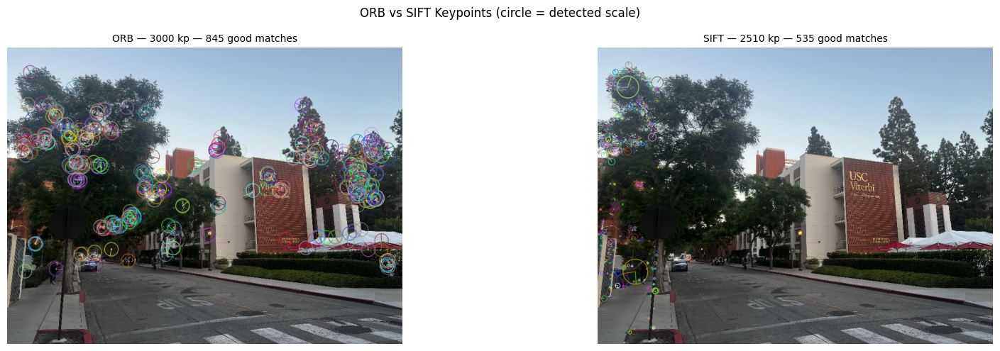

In [ ]:
nd = len(detector_results)
fig, axes = plt.subplots(1, nd, figsize=(9*nd, 5))
if nd == 1:
    axes = [axes]

for ax, (name, (k1, k2, gm)) in zip(axes, detector_results.items()):
    vis = cv2.drawKeypoints(
        images[0], k1[:400], None,
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.set_title(f'{name} — {len(k1)} kp — {len(gm)} good matches', fontsize=10)
    ax.axis('off')

plt.suptitle('ORB vs SIFT Keypoints (circle = detected scale)', fontsize=12)
plt.tight_layout()
plt.show()


---
## Part 8 — Save All Results


In [ ]:
os.makedirs('/content/outputs', exist_ok=True)

def save(fname, img):
    if img is not None:
        p = f'/content/outputs/{fname}'
        cv2.imwrite(p, img)
        print(f'  Saved {fname}  ({img.shape[1]}x{img.shape[0]})')
    else:
        print(f'  Skipped (None): {fname}')

save('manual_panorama.jpg',      manual_panorama)
save('alpha_blend_stitch.jpg',   alpha_result if H12 is not None else None)
save('opencv_panorama_mode.jpg', pano_panorama)
save('opencv_scans_mode.jpg',    pano_scans)

print('\nAll outputs saved to /content/outputs/')
print('Go to Files panel (folder icon on left) to download them.')


  Saved manual_panorama.jpg  (4178x2454)
  Saved alpha_blend_stitch.jpg  (1229x866)
  Saved opencv_panorama_mode.jpg  (1182x628)
  Saved opencv_scans_mode.jpg  (1139x720)

All outputs saved to /content/outputs/
Go to Files panel (folder icon on left) to download them.


---
## Summary & Observations

| Step | What We Did | Key Takeaway |
|---|---|---|
| Dataset | `gaurvivishnoi/panorama` via kagglehub | No manual download, no Kaggle CLI needed |
| Feature Detection | ORB keypoints | Fast, patent-free, good for stitching |
| Matching | BFMatcher + Lowe ratio test (0.75) | Removes ~60-70% of wrong matches |
| Homography | RANSAC, 5px reprojection threshold | Handles remaining outliers robustly |
| Warping | perspectiveTransform + warpPerspective | Projects pixels into shared frame |
| Hard-Cut vs Alpha Blend | Manual blending comparison | Alpha blend hides the seam well |
| OpenCV Stitcher | PANORAMA + SCANS modes | Better quality, exposure correction built-in |
| ORB vs SIFT | Keypoint count + match count | SIFT usually more matches, ORB faster |

### When OpenCV Stitcher Fails
- Less than ~20% overlap between adjacent photos
- Textureless regions (plain sky, blank walls)
- Large parallax — objects at very different depths
- Big exposure differences between shots

**Fix:** lower `setPanoConfidenceThresh(0.3)` or capture images with more overlap.
